In [2]:
import cv2
import numpy as np
import glob
import os
import matplotlib.pyplot as plt
import csv

def track_particle_burns(tiff_folder_path, threshold, new_particle_threshold, frame_rate, max_distance=35, search_previous_frames=3, stop=False, stop_frame=200):
    # Get a sorted list of all TIFF files in the folder
    tiff_files = sorted(glob.glob(os.path.join(tiff_folder_path, "*.tif")))
    if not tiff_files:
        print("Error: No TIFF files found in the specified folder.")
        return

    # Dictionary to store particle burn durations, start/end coordinates, start/end frames, brightnesses and sizes
    particle_lifetimes = {}
    particle_start_frames = {}
    particle_start_coordinates = {}
    particle_end_frames = {}
    particle_end_coordinates = {}
    particle_brightness = {}
    particle_sizes = {}
    next_particle_id = 0
    frame_counter = 0


    for tiff_file in tiff_files:

        if stop and frame_counter > stop_frame:
            break
        print(f"Processing frame {frame_counter}/{len(tiff_files)}: {tiff_file}")

        # Read the TIFF image as grayscale
        frame = cv2.imread(tiff_file, cv2.IMREAD_ANYDEPTH)
        

        # # Calibration, if done in this code
        # new_frame = np.zeros((calibration.shape[0], calibration.shape[1]), dtype=np.uint8)
        # for i in range(frame.shape[0]):
        #     for j in range(frame.shape[1]):
        #     # Only take blue component when subtracting calibration image
        #         if frame[i, j, 0] < calibration[i, j, 0]:
        #             new_frame[i, j] = 0
        #         else:
        #             new_frame[i, j] = frame[i, j, 0] - calibration[i, j, 0]
        # frame = new_frame

        if frame is None:
            print(f"Error: Could not read file {tiff_file}")
            continue
        
        # Threshold to isolate white dots
        _, thresh = cv2.threshold(frame, threshold, 65535, cv2.THRESH_BINARY)
        thresh8 = thresh.astype(np.uint8)

        # Find contours of the white dots
        contours, _ = cv2.findContours(thresh8, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        # Get centroids of detected particles
        current_centroids = []
        for contour in contours:
            x, y, w, h = cv2.boundingRect(contour)
            if w > 1 or h > 1:  # Filter out small contours
                cx, cy = x + w // 2, y + h // 2
                current_centroids.append((cx, cy, w, h))

        # Match current centroids to previous particles
        unmatched_centroids = set(range(len(current_centroids))) #make list of unmatched centroids

        #loop through previous particles to find matches with current centroids
        for particle_id, (px, py) in particle_end_coordinates.items():

            #exit this loop iteration if the particle is too old
            if frame_counter - particle_end_frames[particle_id] > search_previous_frames:
                continue
            
            best_match = None
            best_distance = max_distance*(frame_counter - particle_end_frames[particle_id])  # Initialize with a large distance based on the frame difference
            best_score = best_distance

            for i, (cx, cy, w, h) in enumerate(current_centroids):
                distance = np.sqrt((cx - px) ** 2 + (cy - py) ** 2) #calculate distance
                previous_size = particle_sizes[particle_id]
                current_size = w*h
                size_diff_param = (current_size - previous_size)**2
                score = distance + 0.000005*size_diff_param #large size differences are penalized. adjust size_diff_param coefficient as needed

                #Find closest particle to previous particle
                if score < best_score and i in unmatched_centroids:
                    best_match = i
                    best_score = score

            # If a match is found, update the particle position, end coordinates, end frame and lifetime
            if best_match is not None:
                print("new centroid matched to a particle", frame_counter - particle_end_frames[particle_id], "frames prior to current frame")
                (cx, cy, w, h) = current_centroids[best_match]
                coords = (cx, cy)
                particle_end_coordinates[particle_id] = coords
                particle_brightness[particle_id] = np.append(particle_brightness[particle_id], np.array([np.array(frame[coords[1]-2:coords[1]+2, coords[0]-2:coords[0]+2]).mean()]))
                particle_sizes[particle_id] = w*h

                particle_lifetimes[particle_id] += (frame_counter - particle_end_frames[particle_id])/frame_rate*1000  # Update lifetime by appropriate frame difference, convert to ms
                particle_end_frames[particle_id] = frame_counter
                unmatched_centroids.discard(best_match)

        # Assign new IDs to unmatched centroids
        # Must have at least one pixel within 3 pixels of the center greater than the threshold for the new centroid to count as a new particle
        for i in unmatched_centroids:
            (px, py, w, h) = current_centroids[i]
            new_burning_particle = False
            for j in range(6):
                for k in range(6):
                    try:
                        if frame[py-3+j, px-3+k] > new_particle_threshold:
                            new_burning_particle = True
                            break
                    except IndexError:
                        # If we go out of bounds, just skip this check
                        continue
                if new_burning_particle:
                    break

            if new_burning_particle:
                coords = (px, py)
                print(f"New particle detected at frame {frame_counter}: {coords}; id: {next_particle_id}")
                particle_lifetimes[next_particle_id] = 0

                particle_start_frames[next_particle_id] = frame_counter
                particle_start_coordinates[next_particle_id] = coords

                particle_end_frames[next_particle_id] = frame_counter
                particle_end_coordinates[next_particle_id] = coords
                particle_brightness[next_particle_id] = np.array([np.array(frame[py-2:py+2, px-2:px+2]).mean()])
                particle_sizes[next_particle_id] = w*h

                next_particle_id += 1
        frame_counter += 1

    cv2.destroyAllWindows()

    # Print particle lifetimes
    for particle_id, lifetime in particle_lifetimes.items():
        try:
            print(f"Particle {particle_id}: start frame: {particle_start_frames[particle_id]}; start coordinate: {particle_start_coordinates[particle_id]}; burn time: {round(lifetime, 1)}; end frame: {particle_end_frames[particle_id]}; end coordinate: {particle_end_coordinates[particle_id]}")
        except Exception as e:
            print(f"Error processing particle {particle_id}: {e}")
    
    # Check if output file exists, and add a number in parentheses if it does
    test_num = tiff_folder_path.split(os.sep)[-1]
    base_csv = os.path.join(tiff_folder_path, "..", test_num + "_particle_tracking_results.csv")
    output_csv = base_csv
    count = 1
    while os.path.exists(output_csv):
        output_csv = os.path.splitext(base_csv)[0] + f"({count})" + ".csv"
        count += 1

    # Write results to CSV
    with open(output_csv, mode='w', newline='') as file:
        writer = csv.writer(file)
        writer.writerow([f'threshold={threshold}, new_particle_threshold={new_particle_threshold}, frame_rate={frame_rate}, max_distance={max_distance}, search_previous_frames={search_previous_frames}'])
        writer.writerow(['particle id', 'burn time (ms)', 'start frame', 'start x', 'start y', 'end frame', 'end x', 'end y', 'brightness...'])
        for particle_id in particle_lifetimes.keys():

            lifetime = particle_lifetimes[particle_id]

            start_frame = particle_start_frames[particle_id]
            start_x, start_y = particle_start_coordinates[particle_id]

            end_frame = particle_end_frames[particle_id]
            end_x, end_y = particle_end_coordinates[particle_id]
            brightnesses = particle_brightness[particle_id]

            total_data = np.array([particle_id, lifetime, start_frame, start_x, start_y, end_frame, end_x, end_y])
            for b in brightnesses:
                total_data = np.append(total_data, b)
            print(total_data)
            writer.writerow(total_data)
    print(f"Results written to {output_csv}")
    plt.figure(1)
    hist = plt.hist(np.array(list(particle_lifetimes.values())), bins=100, color='blue', alpha=0.7)
    plt.xlabel('Burn Time (ms)')
    plt.ylabel('Frequency')
    plt.title('Particle Burning Time Histogram')
    return particle_lifetimes, particle_start_coordinates, particle_end_coordinates, particle_end_frames


Processing frame 0/42876: E:\Griffin\20250818\tests 8-10\test8_calibrated\test8_calibrated_00000.tif
Processing frame 1/42876: E:\Griffin\20250818\tests 8-10\test8_calibrated\test8_calibrated_00001.tif
Processing frame 2/42876: E:\Griffin\20250818\tests 8-10\test8_calibrated\test8_calibrated_00002.tif
Processing frame 3/42876: E:\Griffin\20250818\tests 8-10\test8_calibrated\test8_calibrated_00003.tif
Processing frame 4/42876: E:\Griffin\20250818\tests 8-10\test8_calibrated\test8_calibrated_00004.tif
Processing frame 5/42876: E:\Griffin\20250818\tests 8-10\test8_calibrated\test8_calibrated_00005.tif
Processing frame 6/42876: E:\Griffin\20250818\tests 8-10\test8_calibrated\test8_calibrated_00006.tif
Processing frame 7/42876: E:\Griffin\20250818\tests 8-10\test8_calibrated\test8_calibrated_00007.tif
Processing frame 8/42876: E:\Griffin\20250818\tests 8-10\test8_calibrated\test8_calibrated_00008.tif
Processing frame 9/42876: E:\Griffin\20250818\tests 8-10\test8_calibrated\test8_calibrated_

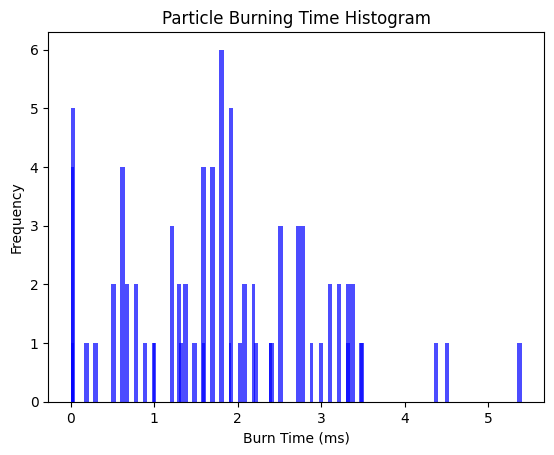

In [3]:
tiff_folders = [r"E:\Griffin\20250818\tests 8-10\test8_calibrated",
                r"E:\Griffin\20250818\tests 8-10\test9_calibrated",
                r"E:\Griffin\20250818\tests 8-10\test10_calibrated"]

threshs = [5000, 5000, 5000]
new_threshs = [45000, 45000, 45000]
fpss = [10000, 10000, 10000]
for i in range(len(tiff_folders)):
    tiff_folder = tiff_folders[i]
    thresh = threshs[i]
    new_thresh = new_threshs[i]
    fps = fpss[i]
    burn_times, start_coords, end_coords, end_frames = track_particle_burns(tiff_folder, thresh, new_thresh, fps, stop=False)

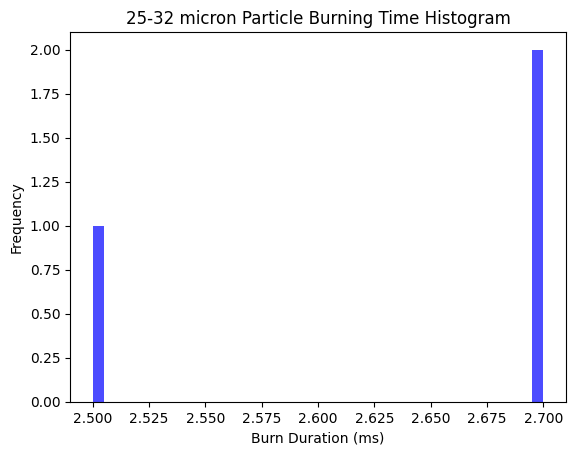

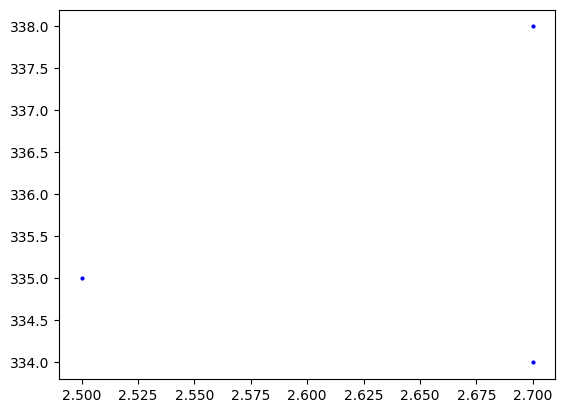

In [30]:
new_burn_times = np.array([])
start_ys = np.array([])
for i in range(len(burn_times)):
    burn_time = burn_times[i]
    start_y = start_coords[i][1]
    if burn_time > 0.2 and burn_time < 10:
        new_burn_times = np.append(new_burn_times, burn_time)
        start_ys = np.append(start_ys, start_y)

plt.figure(1)
hist = plt.hist(new_burn_times, bins=40, color='blue', alpha=0.7)
plt.xlabel('Burn Duration (ms)')
plt.ylabel('Frequency')
plt.title('25-32 micron Particle Burning Time Histogram')

plt.figure(2)
plt.plot(new_burn_times, start_ys, 'o', markersize=2, color='blue')

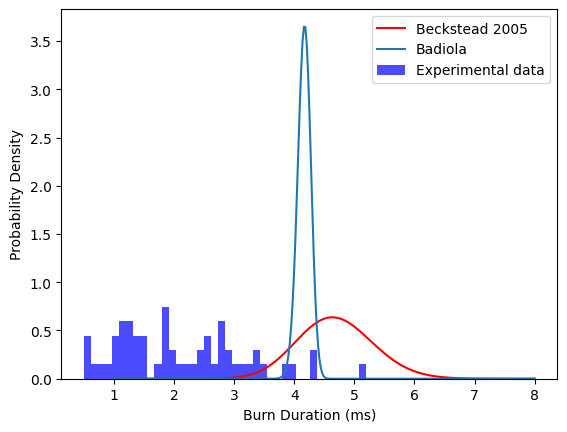

In [6]:
#For 25-30 microns
d5 = 25
d50 = 28.5
val_05 = -1.64485  # 5% value for a standard normal distribution
sigma = (d5 - d50) / (val_05)

xbar = d50
tb = np.linspace(1, 8, 300) #burn times

a_beckstead = 0.00735/(0.21*293**0.2)
n_beckstead = 1.8
D_beckstead = (tb/a_beckstead)**(1/n_beckstead)
p_beckstead = 1/n_beckstead/a_beckstead*D_beckstead**(1-n_beckstead) * 1/(sigma * np.sqrt(2 * np.pi)) * np.exp(-0.5 * ((D_beckstead - xbar) / sigma) ** 2)

a_badiola = 1.29
n_badiola = 0.35
D_badiola = (tb/a_badiola)**(1/n_badiola)
p_badiola = 1/n_badiola/a_badiola*D_badiola**(1-n_badiola) * 1/(sigma * np.sqrt(2 * np.pi)) * np.exp(-0.5 * ((D_badiola - xbar) / sigma) ** 2)

plt.figure(1)
plt.plot(tb, p_beckstead, label='Beckstead 2005', color='red')
plt.plot(tb, p_badiola, label='Badiola')
plt.xlabel('Burn Duration (ms)')
plt.ylabel('Probability Density')
hist = plt.hist(new_burn_times, bins=40, color='blue', alpha=0.7, density=True, label='Experimental data')
legend = plt.legend()

In [30]:
hmm = np.array([[0, 0, 0, 0], [0, 255, 255, 0], [0, 255, 255, 0], [0, 0, 0, 0]]).astype(np.uint8)
contour, _ = cv2.findContours(hmm, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
x, y, w, h = cv2.boundingRect(contour[0])
print(x, y, w, h)

1 1 2 2
